In [157]:
import pandas as pd
import numpy as np
import geopandas as gpd
import math
import geopy

import matplotlib.pyplot as plt
import shapely
%matplotlib inline

from geopy.distance import vincenty
from geopy.distance import great_circle

from shapely.geometry import Point
from matplotlib.backends.backend_pdf import PdfPages


## Here I get the shapefile I need.

In [109]:
bikestation = gpd.read_file('Bike sharing/stazioni/BIKE_SH.shp')
metro = gpd.read_file('metro/fermate/MM_FERM.shp')
milan = gpd.read_file('Milan_shape/milan.shp')

# Changing coordinates

In [110]:
bikestation = bikestation.to_crs(epsg=26591)
metro = metro.to_crs(epsg=26591)
milan = milan.to_crs(epsg=26591)


# City of Milan

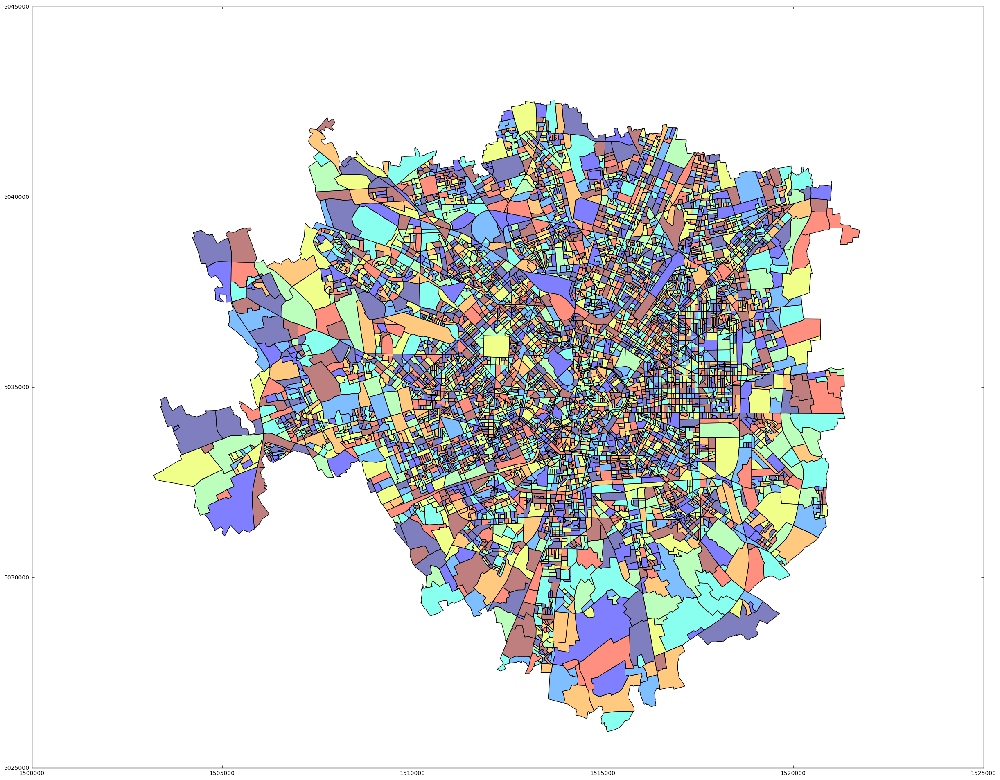

In [142]:
milan.plot(figsize=(30,30))

# Define some usefull function

In [111]:
def buffer_merged_polygon(point, radius):
    point=gpd.GeoDataFrame(point.buffer(radius))
    point.columns=['geometry']
    return point.unary_union

In [112]:
def intersection_polygon_shape(shape,polygon):
    intersection=shape.geometry.intersection(polygon)
    intersection=gpd.GeoDataFrame(intersection)
    intersection.columns=['geometry']
    return intersection

In [113]:
def difference_shape_shape(A,MinusB):
    difference=A.difference(MinusB)
    difference.columns=['geometry']
    return difference

# Find the area I need. Buffer 2500m around metro station 

In [114]:
metro_buffer_2500=buffer_merged_polygon(metro,2500)

In [115]:
milan_2500=intersection_polygon_shape(milan,metro_buffer_2500)

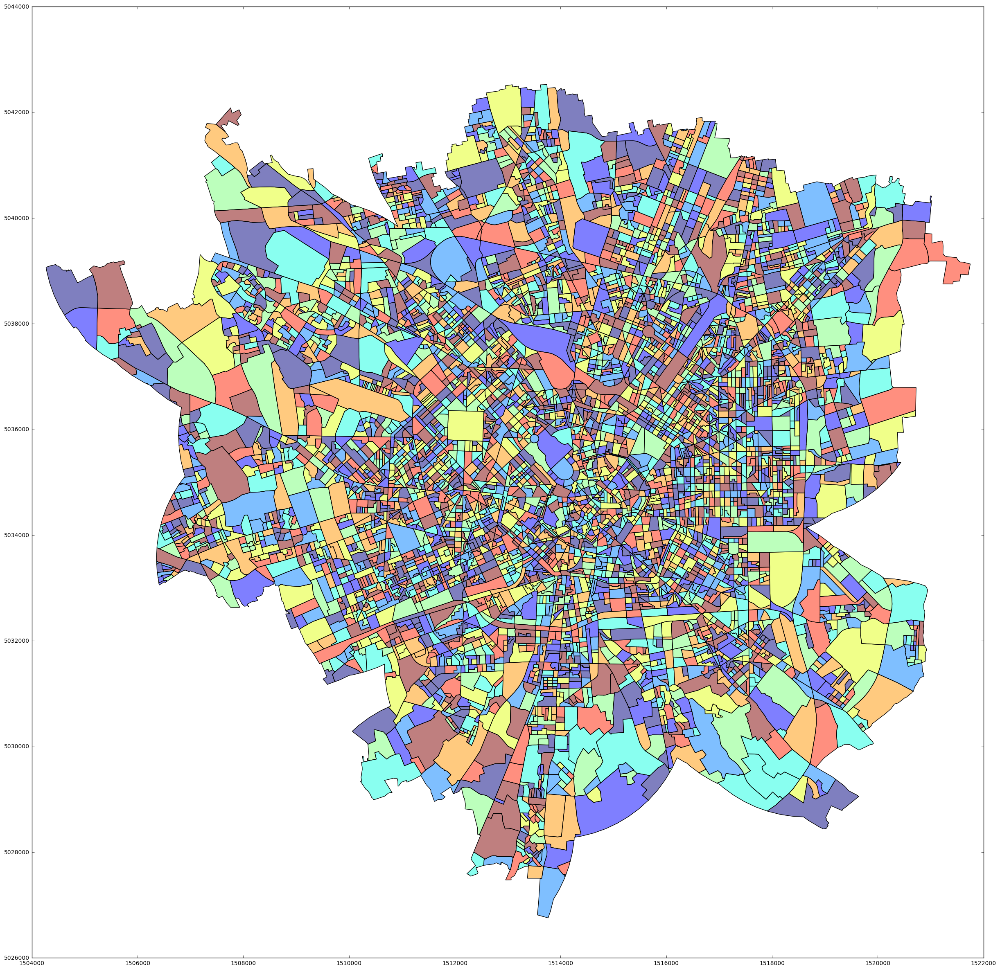

In [138]:
milan_2500.plot(figsize=(30,30))

# Find the area we are not interested in

In [117]:
notbikeablemilan=difference_shape_shape(milan,milan_2500)

/Users/nicolamacchitella/anaconda/lib/python3.5/site-packages/geopandas/base.py:30: UserWarning: GeoSeries crs mismatch: {'no_defs': True, 'init': 'epsg:26591'} and None
  other.crs))


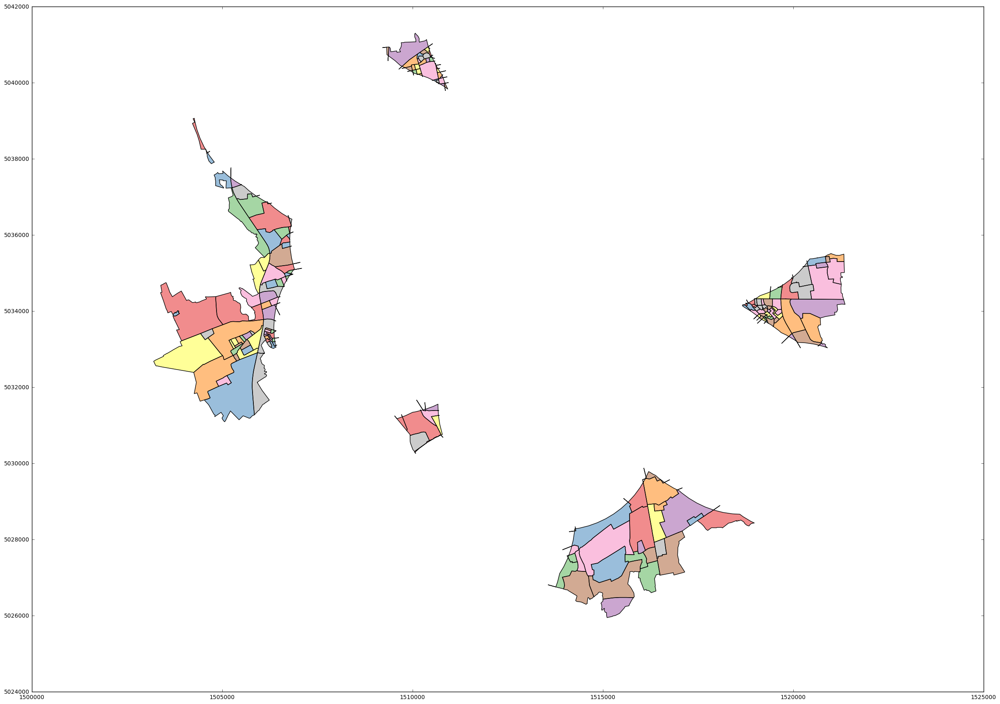

In [139]:
notbikeablemilan.plot(figsize=(30,30))

# Find the area of those who can walk to both a metro or a bike

In [150]:
metro_buffer_600=buffer_merged_polygon(metro,600)

In [151]:
bike_buffer_600=buffer_merged_polygon(bikestation,600)

lets merge this 2 data

In [152]:
metro_bike_600=metro_buffer_600.union(bike_buffer_600)

In [153]:
milan_600=intersection_polygon_shape(milan_2500,metro_bike_600)

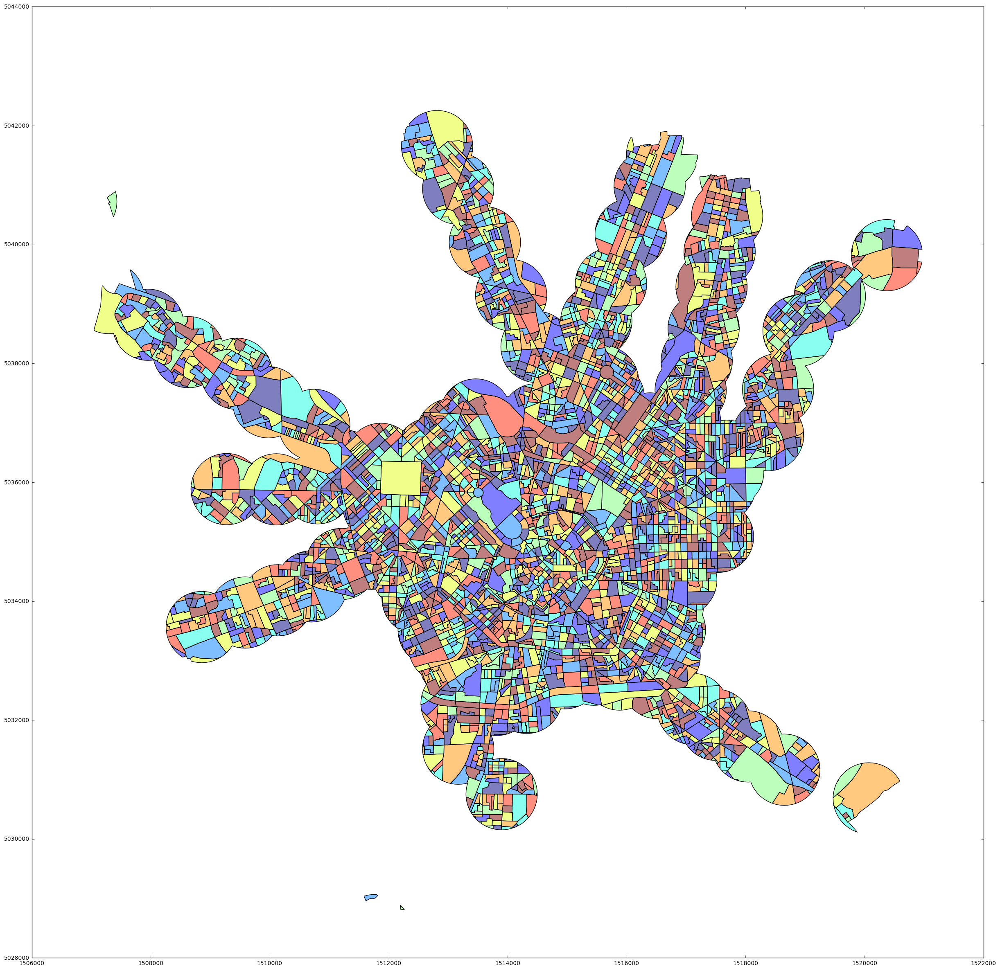

In [154]:
milan_600.plot(figsize=(30,30))

# Find the area of those who would like to bike or walk to a metro but live too far from any metro or bike sharing station to walk there.

In [155]:
interesting_surface=difference_shape_shape(milan_2500,milan_600)

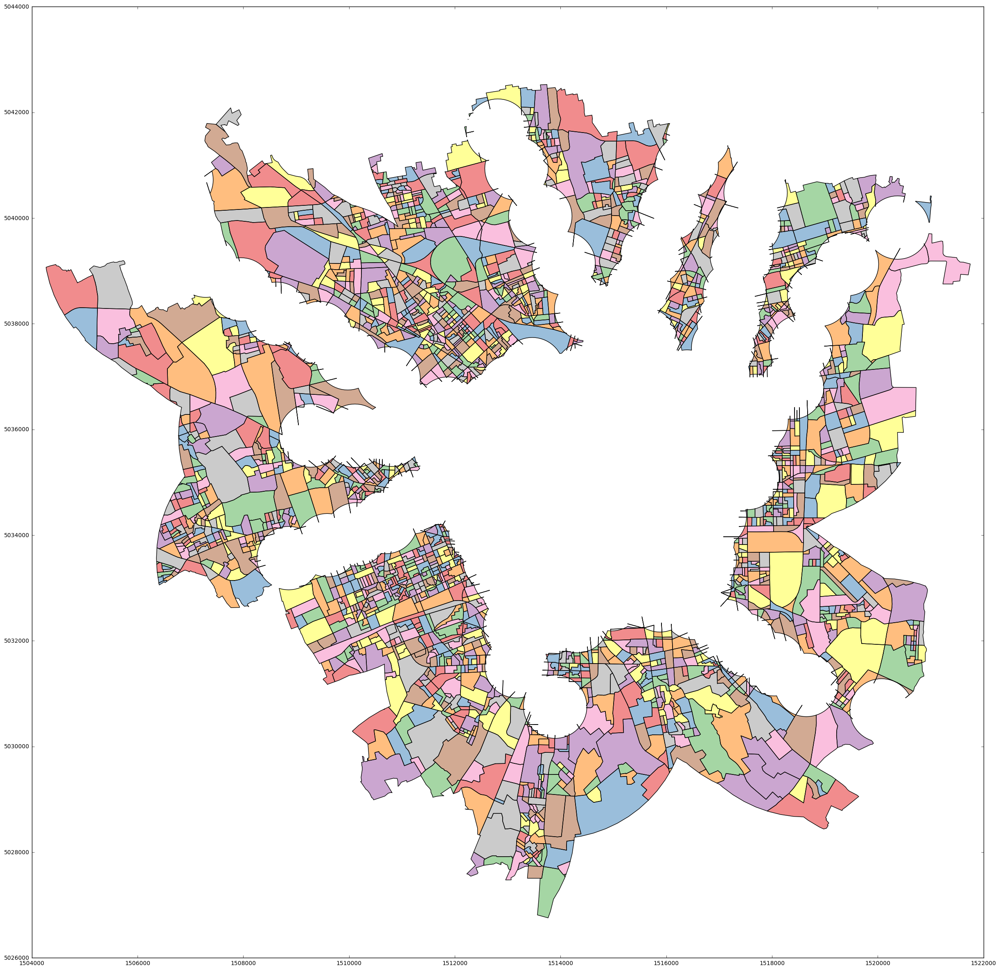

In [156]:
interesting_surface.plot(figsize=(30,30))

# Saving the plot as PDF

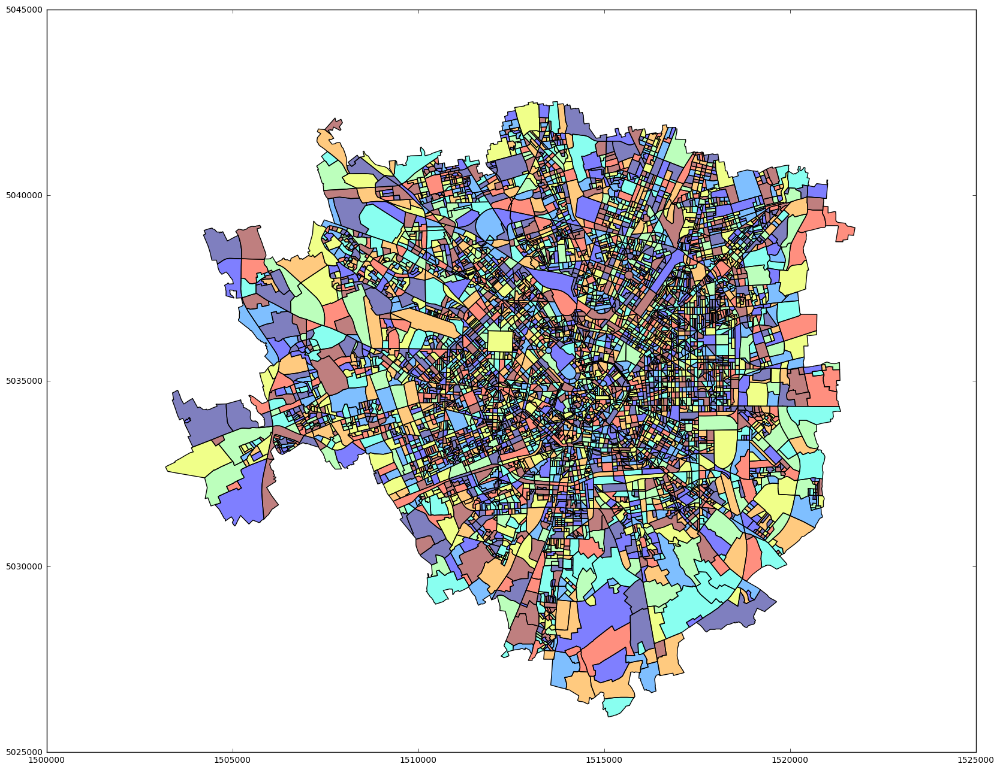

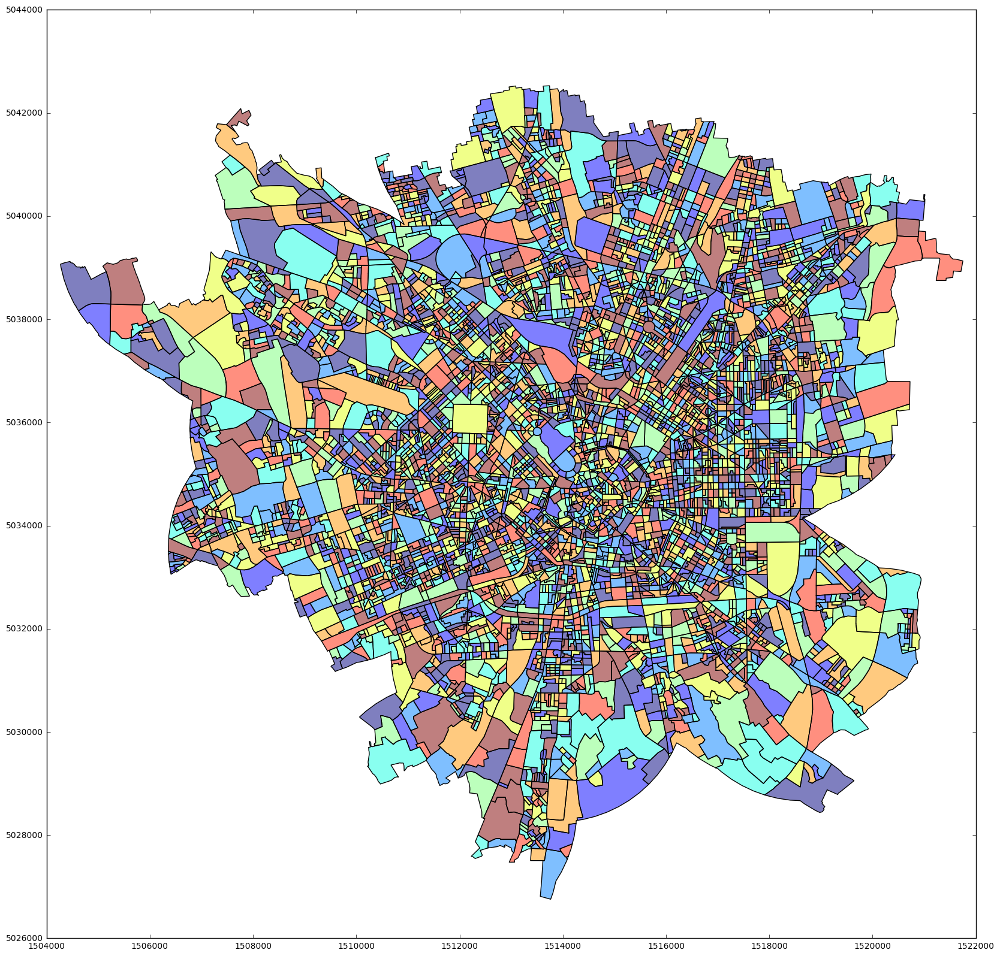

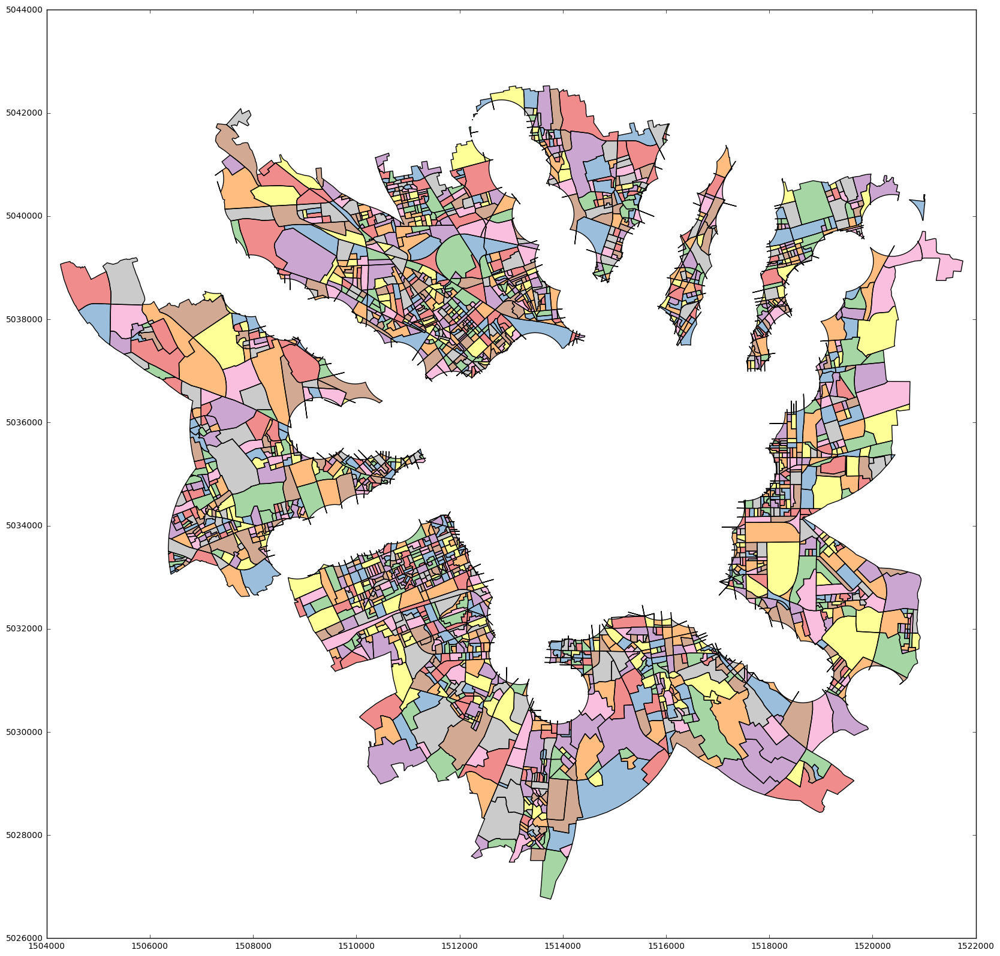

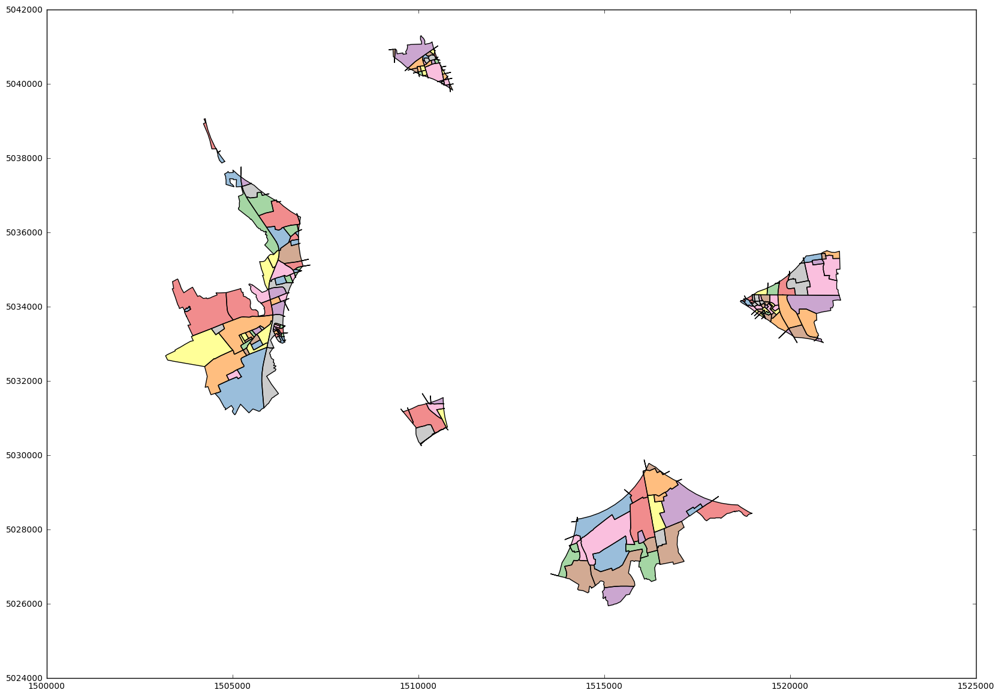

In [163]:
plot1=milan.plot(figsize=(20,20))
plot2=milan_2500.plot(figsize=(20,20))
plot3=interesting_surface.plot(figsize=(20,20))
plot4=notbikeablemilan.plot(figsize=(20,20))


In [164]:
pp = PdfPages('Milan.pdf')
pp.savefig(plot1)
pp.savefig(plot2)
pp.savefig(plot3)
pp.savefig(plot4)
pp.close()

ValueError: No such figure: <matplotlib.axes._subplots.AxesSubplot object at 0x1f69adb00>